## Responsible AI Tutorial

This notebook has te pourpose to introduce a study about bias in modern algorithms, here you will find a case study about biased agorithm and we will look up how to decrease that bias, for such propuse we will use a given dataset and a symple decision tree classifier

In [7]:
!pip install scikit-learn seaborn matplotlib --force
!pip install aequitas==1.0.0 --force
!pip install lime==0.2.0.1 --force
!pip install fairlearn==0.9.0 --force
!pip install pandas --force

#data imports
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

#ml imports
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,classification_report, roc_curve
from sklearn.preprocessing import LabelEncoder

#auditing imports
from aequitas import Audit
import lime
import lime.lime_tabular
from fairlearn.reductions import DemographicParity, ExponentiatedGradient, FalsePositiveRateParity
#defined this because fairlearn still uses PINF that is no longer supported
np.PINF = np.inf

#visualization imports
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

seed=0
sns.set_theme()
np.random.seed(seed)

  Using cached scikit_learn-1.5.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (12 kB)
  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached matplotlib-3.9.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached numpy-2.1.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached scipy-1.14.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.5.0-py3-none-any.whl.metadata (13 kB)
  Using cached pandas-2.2.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (19 kB)
  Using cached contourpy-1.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (5.4 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.53.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1

## What are we working with?

We use the loan elligible dataset (https://www.kaggle.com/datasets/vikasukani/loan-eligible-dataset). This dataset contains the status of loans of different people, each represented by 11 attributes, ranging from gender to the property area for the housing they applied to loan.

Structure of the data frame

In [8]:
df = pd.read_csv('data/loan-train.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


Data Description After Removing NaN Values

In [9]:
#For simplicity sake, we will rows with nan values, leaving us with 480 non-nan rows
df=df.dropna().reset_index(drop=True)
df.describe()

,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History
count,480.000000,480.000000,480.000000,480.000000,480.000000
mean,5364.231250,1581.093583,144.735417,342.050000,0.854167
std,5668.251251,2617.692267,80.508164,65.212401,0.353307
min,150.000000,0.000000,9.000000,36.000000,0.000000
25%,2898.750000,0.000000,100.000000,360.000000,1.000000
50%,3859.000000,1084.500000,128.000000,360.000000,1.000000
75%,5852.500000,2253.250000,170.000000,360.000000,1.000000
max,81000.000000,33837.000000,600.000000,480.000000,1.000000


Preview of the DataFrame

In [19]:
df.head(5)

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
1,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
2,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
3,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
4,LP001011,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,Y


In [46]:
# The categorical variables mostly assume just two values or are ordinal (Rural, Semiurban, Urban)
# Thus we can use label encoding rather than one hot encoding
display(df['Gender'].value_counts())
display(df['Married'].value_counts())
display(df['Education'].value_counts())
display(df['Self_Employed'].value_counts())
display(df['Dependents'].value_counts())
display(df['Property_Area'].value_counts())

Gender
Male      394
Female     86
Name: count, dtype: int64

Married
Yes    311
No     169
Name: count, dtype: int64

Education
Graduate        383
Not Graduate     97
Name: count, dtype: int64

Self_Employed
No     414
Yes     66
Name: count, dtype: int64

Dependents
0     274
2      85
1      80
3+     41
Name: count, dtype: int64

Property_Area
Semiurban    191
Urban        150
Rural        139
Name: count, dtype: int64

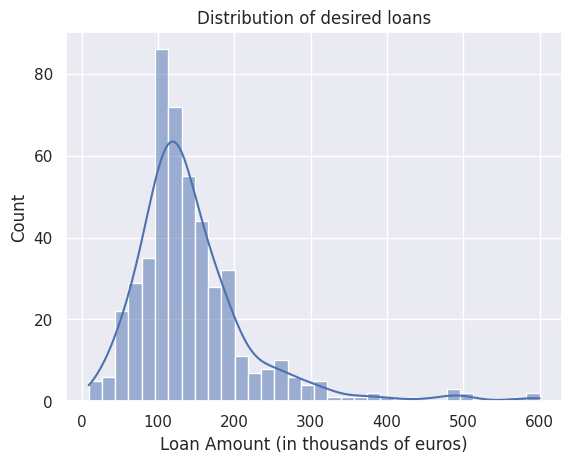

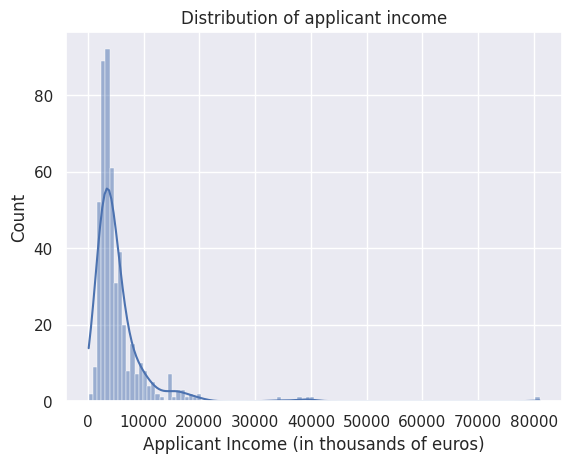

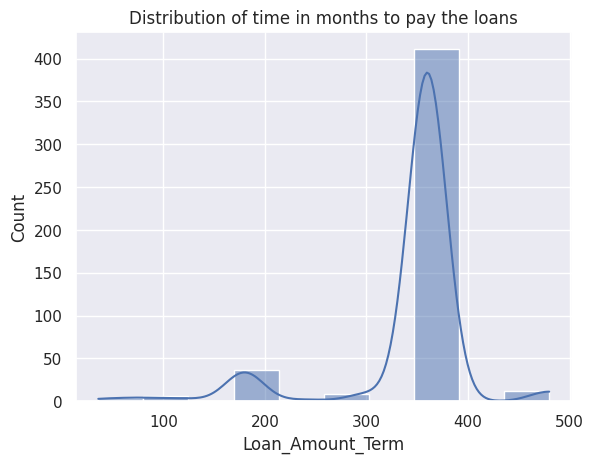

In [60]:
#colocar label nos eixos
ax = sns.histplot(df['LoanAmount'],kde=True)
ax.set_title('Distribution of desired loans')
ax.set_xlabel('Loan Amount (in thousands of euros)')
plt.show()
ax = sns.histplot(df['ApplicantIncome'],kde=True)
ax.set_title('Distribution of applicant income')
ax.set_xlabel('Applicant Income (in thousands of euros)')
plt.show()
ax = sns.histplot(df['Loan_Amount_Term'],kde=True)
ax.set_title('Distribution of time in months to pay the loans')
plt.show()

We can see that most loans are on the ballpark of 50-200K euros. Meanwhile, most incomes are lower than 10k euros. 

Additionally, most loans have 30 years/360 months to be paid. Some people may not be able to pay their loans.

With this in mind, companies attempt to reduce their losses by loaning to people who are more likely to pay.

Suppose that a company wants to train a classifier to define to whom they should loan to. However, they want this model to have as little bias as possible. We have, thus, been contacted by them to audit their system to ensure that it is up to standards and fix it if needed.

### Data preparation  for creating the model

First, we create two DataFrames: 
- X, created to keep the features that will be used to train the model
- Y, created as a target variable that our model will try to predict.

In [61]:
X = df.drop(columns=['Loan_ID','Loan_Status'])
y = df['Loan_Status']

Now we transform the values in collumns to nummeric values

In [14]:
#First, we encode the categorical values
gender_encoder = LabelEncoder()
X['Gender'] = gender_encoder.fit_transform(X['Gender'])

married_encoder = LabelEncoder()
X['Married'] = married_encoder.fit_transform(X['Married'])

education_encoder = LabelEncoder()
X['Education'] = education_encoder.fit_transform(X['Education'])

employment_encoder = LabelEncoder()
X['Self_Employed'] = employment_encoder.fit_transform(X['Self_Employed'])


dependent_encoder = LabelEncoder().fit(['0','1','2','3+'])
X['Dependents'] = dependent_encoder.transform(X['Dependents'])

property_area_encoder = LabelEncoder().fit(['Rural','Semiurban','Urban'])
X['Property_Area'] = property_area_encoder.transform(X['Property_Area'])

loan_status_encoder =  LabelEncoder()
y = pd.Series(loan_status_encoder.fit_transform(y),name='Loan_Status')

Next we divide the data between train and test data

In [15]:
#Separate train/test - 70% train, 30% test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=seed)

### Training and testing the model

Training stage

In [17]:
#First training the model, here we use a very simple model as an example
dt_model = DecisionTreeClassifier(random_state=seed,max_leaf_nodes=16)
dt_model = dt_model.fit(X_train,y_train)
print(f'Train accuracy: {dt_model.score(X_train,y_train)}')

Train accuracy: 0.8541666666666666


Test stage

              precision    recall  f1-score   support

           0       0.74      0.53      0.62        49
           1       0.79      0.91      0.84        95

    accuracy                           0.78       144
   macro avg       0.77      0.72      0.73       144
weighted avg       0.77      0.78      0.77       144



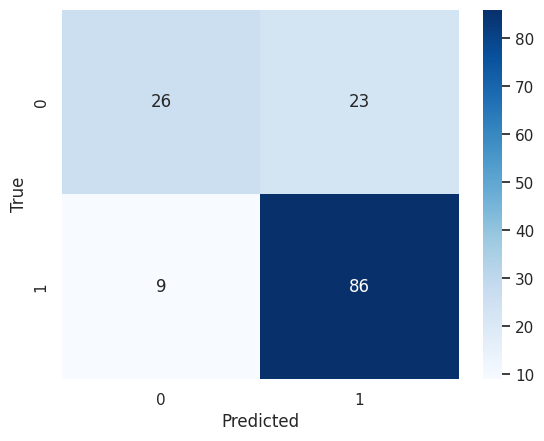

In [20]:
#Now to test the model
y_hat = dt_model.predict(X_test)
print(classification_report(y_test,y_hat))
ax = sns.heatmap(confusion_matrix(y_test,y_hat),annot=True,cmap='Blues')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
plt.show()

## Auditing the system

Suppose that the company is satisfied by this classifier performance and will start using it for their next loans.

Now, we, as independent auditors, want to evaluate how this system fares in regards to bias.

For this we will make use of the aequitas framework (https://github.com/dssg/aequitas).

Note that aequitas works only for binary classification and categorical attributes.

We will use three metrics to measure fairness: TPR, FPR and PPREV

# TODO: EXPAND ON THE METRICS - WHY ARE WE USING THEM?

In [21]:
#First, we will prepare a dataframe that includes model predictions
output_df = pd.concat([X_test, y_test], axis=1)
output_df['score']=y_hat
output_df.rename(columns={'Loan_Status':'label'},inplace=True)

#we will also return the label encoding to more easily understandable formats
output_df['Gender'] = gender_encoder.inverse_transform(output_df['Gender'])

output_df['Married'] = married_encoder.inverse_transform(output_df['Married'])

output_df['Education'] = education_encoder.inverse_transform(output_df['Education'])

output_df['Self_Employed'] = employment_encoder.inverse_transform(output_df['Self_Employed'])

output_df['Dependents'] = dependent_encoder.inverse_transform(output_df['Dependents'])

output_df['Property_Area'] = property_area_encoder.inverse_transform(output_df['Property_Area'])

In [22]:
audit = Audit(output_df,sensitive_attribute_column=['Gender','Education','Property_Area'],reference_groups={'Education':'Graduate', 'Gender':'Male','Property_Area':'Urban'})
audit.audit()

In [23]:
audit.summary_plot(["tpr", "fpr", "pprev"])

alt.VConcatChart(...)

We see that this model seems to be biased against rural properties and towards woman, showing a higher false positive rate for woman and lower true positive rate and pprev for rural properties.

This means that men and people who desire a rural property are having a harder time getting loans, even whey they should not have.

We visualize some of these disparities below.

In [24]:
audit.disparity_plot(attribute="Property_Area", metrics=["TPR","FPR","PPREV"])

alt.LayerChart(...)

In [25]:
audit.disparity_plot(attribute="Gender", metrics=["TPR","FPR","PPREV"])

alt.LayerChart(...)

## Explanations for bias/unfairness

Well, it would be nice if our model was already fair. Unfortunately, we saw that it is not. In this section, we try to understand what could have led to the unfairness shown by the model.

We will use these insights to then improve our model so that it is not unfair towards any groups.

### Explainable AI

One interest aspect to consider is what may be driving our model to make such unfair predictions.

One can use Explainable AI or xai techniques to attempt to understand what may be driving the different performances of our model when considering different groups.

For this example, we will use the LIME(https://github.com/marcotcr/lime) tool.

In [26]:
#First, we prepare the LIME explainer

categorical_features = [list(X_train.columns).index(feature) for feature in ['Gender','Married','Dependents','Education','Self_Employed','Property_Area']]

categorical_names = {
    categorical_features[0]:gender_encoder.classes_,
    categorical_features[1]:married_encoder.classes_,
    categorical_features[2]:dependent_encoder.classes_,
    categorical_features[3]:education_encoder.classes_,
    categorical_features[4]:employment_encoder.classes_,
    categorical_features[5]:property_area_encoder.classes_,
}

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,class_names=['No', 'Yes'], feature_names = list(X_train.columns),
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, verbose=True)

#this function will be used by lime later to explain predictions
predict_function = lambda x: dt_model.predict_proba(x).astype(float)

Let's look at some examples of why woman had a higher false positive rate.

For example, we will take the example of false negative rural properties to see why these people are getting denied.

In [27]:
explain_df = pd.concat([X_test.reset_index(drop=True),y_test.reset_index(drop=True),pd.Series(y_hat,name='score')],axis=1)


false_negative = explain_df[(explain_df['Loan_Status']==1) & (explain_df['score']==0)]
false_negative_rural = false_negative[false_negative['Property_Area']==list(property_area_encoder.classes_).index('Rural')].sample(n=2,random_state=seed).drop(columns=['score','Loan_Status']).values
false_negative_urban = false_negative[false_negative['Property_Area']==list(property_area_encoder.classes_).index('Urban')].sample(n=1,random_state=seed).drop(columns=['score','Loan_Status']).values

In [29]:
exp = explainer.explain_instance(false_negative_rural[0], predict_function)
exp.show_in_notebook(show_all=False)
exp = explainer.explain_instance(false_negative_rural[1], predict_function)
exp.show_in_notebook(show_all=False)

Intercept 0.3234444430682204
Prediction_local [0.60028659]
Right: 0.5


Intercept 0.3590879173262119
Prediction_local [0.61715868]
Right: 0.5


In [30]:
exp = explainer.explain_instance(false_negative_urban[0], predict_function)
exp.show_in_notebook(show_all=False)

Intercept 0.4212953869025699
Prediction_local [0.46870495]
Right: 0.0


We can see that the location of the property area being rural is being weighted heavily by the classifier, which may not be desirable if the aim of our model is to be equally as accurate for groups of people with distinct needs.

And what about the gender bias? Why are woman less likely to be denied?

In [31]:
false_positive = explain_df[(explain_df['Loan_Status']==0) & (explain_df['score']==1)]
false_positive_woman = false_positive[false_positive['Gender']==0].sample(n=2,random_state=seed).drop(columns=['score','Loan_Status']).values
false_positive_men = false_positive[false_positive['Gender']==1].sample(n=2,random_state=seed).drop(columns=['score','Loan_Status']).values

In [32]:
exp = explainer.explain_instance(false_positive_woman[0], predict_function)
exp.show_in_notebook(show_all=False)
exp = explainer.explain_instance(false_positive_woman[1], predict_function)
exp.show_in_notebook(show_all=False)

Intercept 0.28227720192895295
Prediction_local [0.75955338]
Right: 1.0


Intercept 0.4363560876850875
Prediction_local [0.60421031]
Right: 0.7951807228915663


In [33]:
exp = explainer.explain_instance(false_positive_men[0], predict_function)
exp.show_in_notebook(show_all=False)
exp = explainer.explain_instance(false_positive_men[1], predict_function)
exp.show_in_notebook(show_all=False)

Intercept 0.3870636659094393
Prediction_local [0.54566098]
Right: 1.0


Intercept 0.42352664971231235
Prediction_local [0.41688748]
Right: 0.92


We see loan terms, loan amount, marriage and income as important factors as to why a loan may be given. However, gender does not seem to be important. In fact, gender being female shows as a factor for denying a loan.

What gives?

In [34]:
#We look at the statistics for the different genders in an attempt to find out

print('Male Statistics')
display(output_df[output_df['Gender']=='Male'][['Loan_Amount_Term','LoanAmount','ApplicantIncome','CoapplicantIncome']].describe())

print('Female Statistics')
display(output_df[output_df['Gender']=='Female'][['Loan_Amount_Term','LoanAmount','ApplicantIncome','CoapplicantIncome']].describe())

Male Statistics


,Loan_Amount_Term,LoanAmount,ApplicantIncome,CoapplicantIncome
count,118.000000,118.000000,118.000000,118.000000
mean,331.728814,144.720339,5746.754237,1673.237288
std,72.315981,73.641298,8559.648815,1924.048668
min,60.000000,17.000000,150.000000,0.000000
25%,360.000000,101.000000,2934.750000,0.000000
50%,360.000000,128.000000,3846.000000,1508.000000
75%,360.000000,172.000000,5754.250000,2500.000000
max,480.000000,436.000000,81000.000000,10968.000000


Female Statistics


,Loan_Amount_Term,LoanAmount,ApplicantIncome,CoapplicantIncome
count,26.000000,26.000000,26.000000,26.000000
mean,361.384615,126.538462,4383.000000,659.576923
std,76.974321,60.209787,3813.423134,1075.716809
min,36.000000,36.000000,645.000000,0.000000
25%,360.000000,86.750000,2254.250000,0.000000
50%,360.000000,122.500000,3283.000000,0.000000
75%,360.000000,147.750000,4601.500000,1641.000000
max,480.000000,259.000000,18165.000000,3683.000000


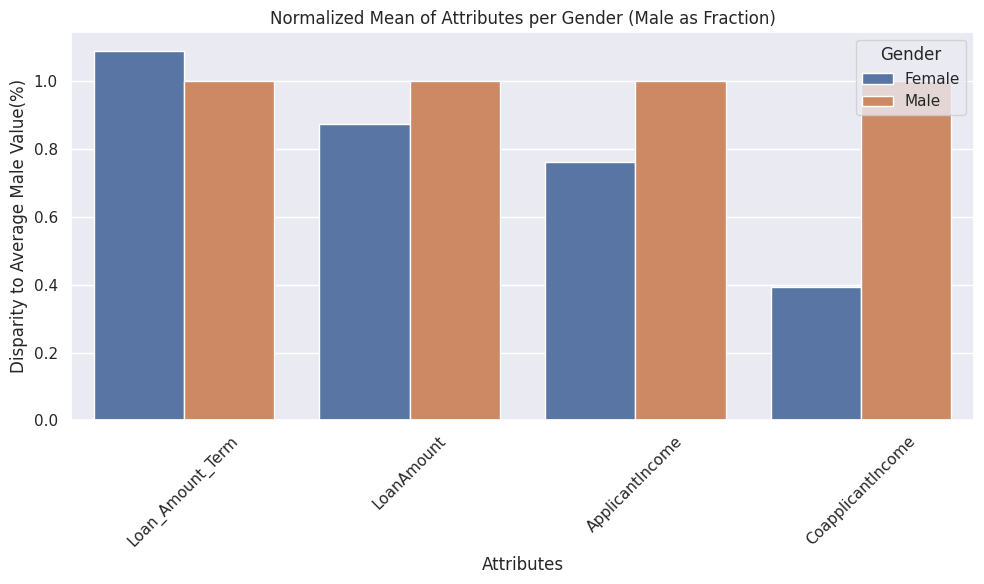

In [35]:
mean_df = output_df[['Gender','Loan_Amount_Term','LoanAmount','ApplicantIncome','CoapplicantIncome']].groupby('Gender').mean().reset_index()

# Extract the mean values for 'Male'
male_means = mean_df[mean_df['Gender'] == 'Male'].iloc[:, 1:]  # Exclude Gender column

# Normalize all values by dividing by the male means
normalized_df = mean_df.copy()
for col in male_means.columns:
    normalized_df[col] = mean_df[col] / float(male_means[col])

# Reshape the dataframe to long format for seaborn
normalized_df_melted = normalized_df.melt(id_vars='Gender', var_name='Attribute', value_name='Normalized Mean')

# Plot the normalized barplot
plt.figure(figsize=(10, 6))
sns.barplot(x='Attribute', y='Normalized Mean', hue='Gender', data=normalized_df_melted)

# Add labels and title
plt.title('Normalized Mean of Attributes per Gender (Male as Fraction)')
plt.xticks(rotation=45)
plt.ylabel('Disparity to Average Male Value(%)')
plt.xlabel('Attributes')

# Show the plot
plt.tight_layout()
plt.show()

Well, it seems female applicants have in general a tendency to request a smaller loan to be paid in more time, while also having lower income and coapplicant income. All factors that seem to be desirable to our model. It seems that this bias is not happening solely due to gender, but due to a variety of different factors that take shape as the features of our dataset.

## Mitigating Bias

So, now we know we have a biased model and we know what may be influencing our model to be biased. How can we mitigate that, then?

There are many possible approaches, of which we shall discuss two of them.

1) Removing sensible attributes from the model
- This may work well for the case of the property area, as it was clear that the model was using it to the disproportional detriment of some groups

2) Calibrating the model according to the sensible attributes
- Changing the probability thresholds of a model according to sensible attributes may lead to fairer classification across all groups

3) Regularization/optimizing for fairness
- Here we use the fairlearn package, but there are many others

### Removing sensible attributes

In [36]:
#We retrain the model dropping the sensible attribute
no_property_model = DecisionTreeClassifier(random_state=seed,max_leaf_nodes=16)
no_property_model = no_property_model.fit(X_train.drop(columns='Property_Area'),y_train)
print(f'Train accuracy: {no_property_model.score(X_train.drop(columns="Property_Area"),y_train)}')

Train accuracy: 0.8660714285714286


              precision    recall  f1-score   support

           0       0.76      0.53      0.63        49
           1       0.79      0.92      0.85        95

    accuracy                           0.78       144
   macro avg       0.78      0.72      0.74       144
weighted avg       0.78      0.78      0.77       144



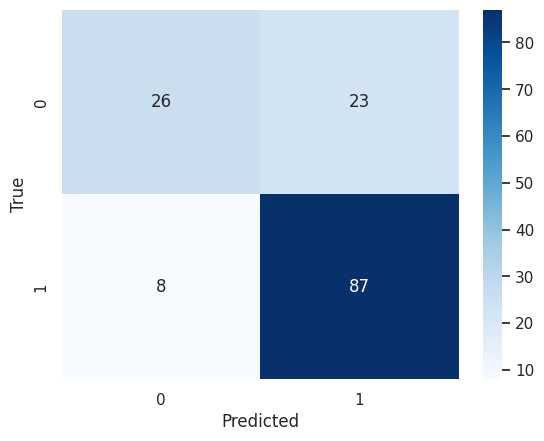

In [37]:
#Now to test the model
y_hat = no_property_model.predict(X_test.drop(columns='Property_Area'))
print(classification_report(y_test,y_hat))
ax = sns.heatmap(confusion_matrix(y_test,y_hat),annot=True,cmap='Blues')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
plt.show()

In [38]:
output_df['no_property_score'] = y_hat
audit = Audit(output_df,sensitive_attribute_column=['Property_Area'],reference_groups={'Property_Area':'Urban'},score_column='no_property_score')
audit.audit()

In [39]:
audit.summary_plot(["tpr", "fpr", "pprev"])

alt.VConcatChart(...)

Here we see that dropping the sensible attribute did not hurt accuracy. However, when we now look at the biases, we see that the new resulting model no longer shows the same biases than the previous one, in fact, it now favors rural property areas. It seems that this alone was not enough to totally remove the biases relating to the rural properties. And this is where recalibration becomes interesting.

### Recalibrating the model

One can change the probabilities of groups a posteriori so that they have equal opportunities.

Let's take this new classifier we've just built, which we will then recalibrate so that the FPR is within the acceptable disparity.

# TODO: This part or some other type of recalibration as an example
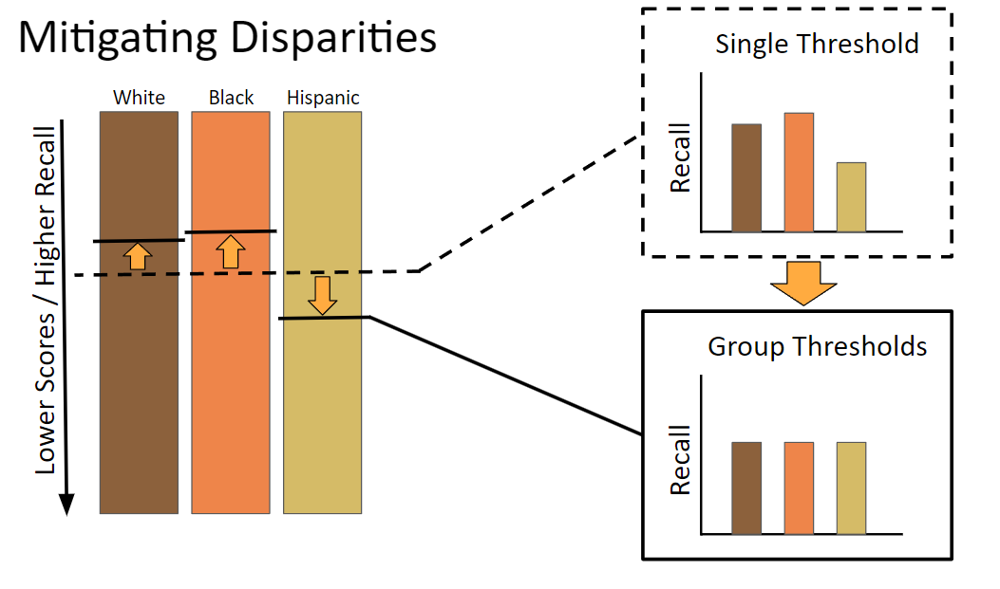

### Optimizing for fairness

First we will optimize for demographic parity, meaning that we constrain probability P(y=1|X) to be roughly equal for every group. This should fix the bias we observe in regards to the Property Area attribute, as it has significantly lower TPR than the other groups.

Then we attempt to fix the gender bias by constraining the false positive rate between groups to be roughly the same.

#### Ensuring demographic parity

In [40]:
#We will use the same classifier as the first one, 
# but now, we will optimize using the fairlearn library to ensure demographic parity
# first, we define the sensitive features
sensitive_features = X_train[['Gender','Property_Area']]

#train the model optimizing for demographic parity
constraint = DemographicParity()
classifier = DecisionTreeClassifier(min_samples_leaf=15, random_state=seed)
mitigator = ExponentiatedGradient(classifier, constraint)
mitigator.fit(X_train, y_train, sensitive_features=sensitive_features)

ExponentiatedGradient(constraints=<fairlearn.reductions._moments.utility_parity.DemographicParity object at 0x7fed8829c190>,
                      estimator=DecisionTreeClassifier(min_samples_leaf=15,
                                                       random_state=0),
                      nu=np.float64(0.010462572721956569))

              precision    recall  f1-score   support

           0       0.76      0.53      0.63        49
           1       0.79      0.92      0.85        95

    accuracy                           0.78       144
   macro avg       0.78      0.72      0.74       144
weighted avg       0.78      0.78      0.77       144



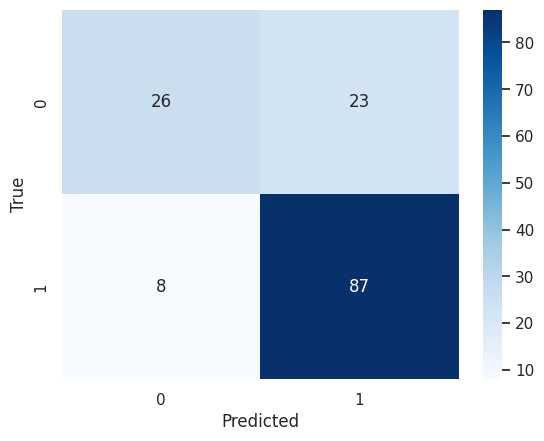

In [41]:
#Now to test the model, we see that the performance is still the same
y_hat_mitigated = mitigator.predict(X_test)
print(classification_report(y_test,y_hat))
ax = sns.heatmap(confusion_matrix(y_test,y_hat),annot=True,cmap='Blues')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
plt.show()

In [42]:
output_df['mitigated_score'] = y_hat_mitigated
audit = Audit(output_df,sensitive_attribute_column=['Gender','Education','Property_Area'],reference_groups={'Education':'Graduate', 'Gender':'Male','Property_Area':'Urban'},score_column='mitigated_score')
audit.audit()
audit.summary_plot(["tpr", "fpr", "pprev"])

alt.VConcatChart(...)

#### Ensuring equal FPR

In [43]:
#We will use the same classifier as the first one, 
# but now, we will optimize using the fairlearn library to ensure demographic parity
# first, we define the sensitive features
sensitive_features = X_train[['Gender','Property_Area']]

#train the model optimizing for demographic parity
constraint = FalsePositiveRateParity()
classifier = DecisionTreeClassifier(min_samples_leaf=15, random_state=seed)
mitigator = ExponentiatedGradient(classifier, constraint)
mitigator.fit(X_train, y_train, sensitive_features=sensitive_features)

ExponentiatedGradient(constraints=<fairlearn.reductions._moments.utility_parity.FalsePositiveRateParity object at 0x7fed6065a710>,
                      estimator=DecisionTreeClassifier(min_samples_leaf=15,
                                                       random_state=0),
                      nu=np.float64(0.010462572721956569))

              precision    recall  f1-score   support

           0       0.76      0.53      0.63        49
           1       0.79      0.92      0.85        95

    accuracy                           0.78       144
   macro avg       0.78      0.72      0.74       144
weighted avg       0.78      0.78      0.77       144



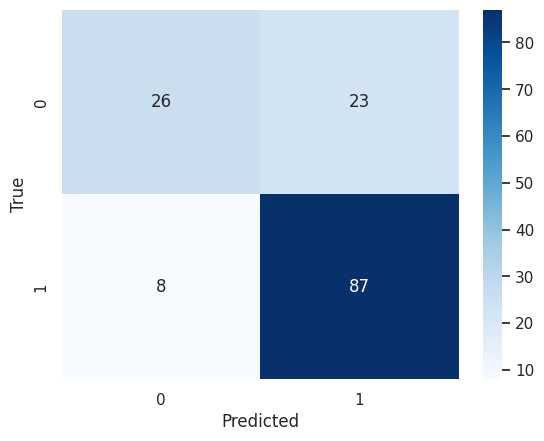

In [44]:
#Now to test the model, we see that the performance is still the same
y_hat_mitigated = mitigator.predict(X_test)
print(classification_report(y_test,y_hat))
ax = sns.heatmap(confusion_matrix(y_test,y_hat),annot=True,cmap='Blues')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
plt.show()

In [45]:
output_df['mitigated_score'] = y_hat_mitigated
audit = Audit(output_df,sensitive_attribute_column=['Gender','Education','Property_Area'],reference_groups={'Education':'Graduate', 'Gender':'Male','Property_Area':'Urban'},score_column='mitigated_score')
audit.audit()
audit.summary_plot(["tpr", "fpr", "pprev"])

alt.VConcatChart(...)

We can see that for our example, both reductions worked well. By ensuring either similar FPR between groups or demographic parity, we ended up with a fairer model in regards to our relevant metrics across all sensitive attributes and groups.

# Conclusion

In this tutorial, we explored some tools relating to Responsible Ai, with applications towards auditing algorithms, reducing bias, and increasing fairness, explicability and transparency. We also introduced some metrics with ample usage in this context and how they relate to fairness.

During the many different steps and with the usage of a variety of tools, we were able to understand where the model biases may come from, applying distinct methods to mitigate these problems.

While this is just a toy example, it serves as an introduction to the area of which practicioners can draw inspiration to make their models fairer. It is important to note that there is no silver bullet and the methods that worked best for this problem may be worse than others in different contexts and with different model architectures.

